Connected to venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
print("Check TensorFlow:", tf.__version__)
print("Check Keras:", kr.__version__)

Check TensorFlow: 2.16.1


NameError: name 'kr' is not defined

In [ ]:
img_height = 250
img_width = 250
batch_size = 32


In [ ]:
dataset_urls = "file:\\D:\\Pygame projects\\DATH_TTNT\\lfw-funneled.tgz"
archive = tf.keras.utils.get_file('lfw_funneled.tgz', origin=dataset_urls, extract=True)
data_dir = pathlib.Path(archive).with_suffix('')


In [ ]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)


13233


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)


Found 13233 files belonging to 5749 classes.
Using 10587 files for training.
Found 13233 files belonging to 5749 classes.
Using 2646 files for validation.


In [ ]:
class_names = train_ds.class_names


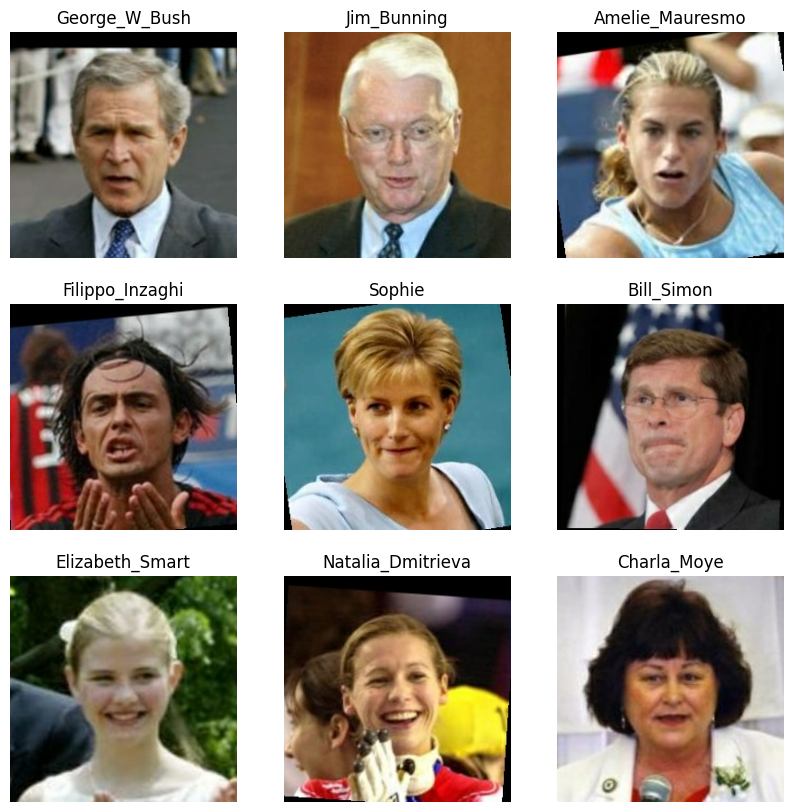

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)


In [ ]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break



(32, 250, 250, 3)
(32,)


In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Rescaling(1./255, input_shape= (250, 250, 3) ),
    layers.Conv2D(16, (3, 3), activation='sigmoid'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, (3, 3), activation='sigmoid'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='sigmoid'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='sigmoid'),
    layers.Dense(num_classes)
])


d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 250, 250, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 248, 248, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 124, 124, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 122, 122, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 61, 61, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 59, 59, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 53824)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     6,889,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5749)           │       741,621 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,654,805 (29.20 MB)

 Trainable params: 7,654,805 (29.20 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])



In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10


: 

In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 4
)


NameError: name 'model' is not defined

Restarted venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
img_height = 250
img_width = 250
batch_size = 32


In [ ]:
dataset_urls = "file:\\D:\\Pygame projects\\DATH_TTNT\\lfw-funneled.tgz"
archive = tf.keras.utils.get_file('lfw_funneled.tgz', origin=dataset_urls, extract=True)
data_dir = pathlib.Path(archive).with_suffix('')



In [ ]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)


13233


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)


Found 13233 files belonging to 5749 classes.
Using 10587 files for training.
Found 13233 files belonging to 5749 classes.
Using 2646 files for validation.


In [ ]:
class_names = train_ds.class_names


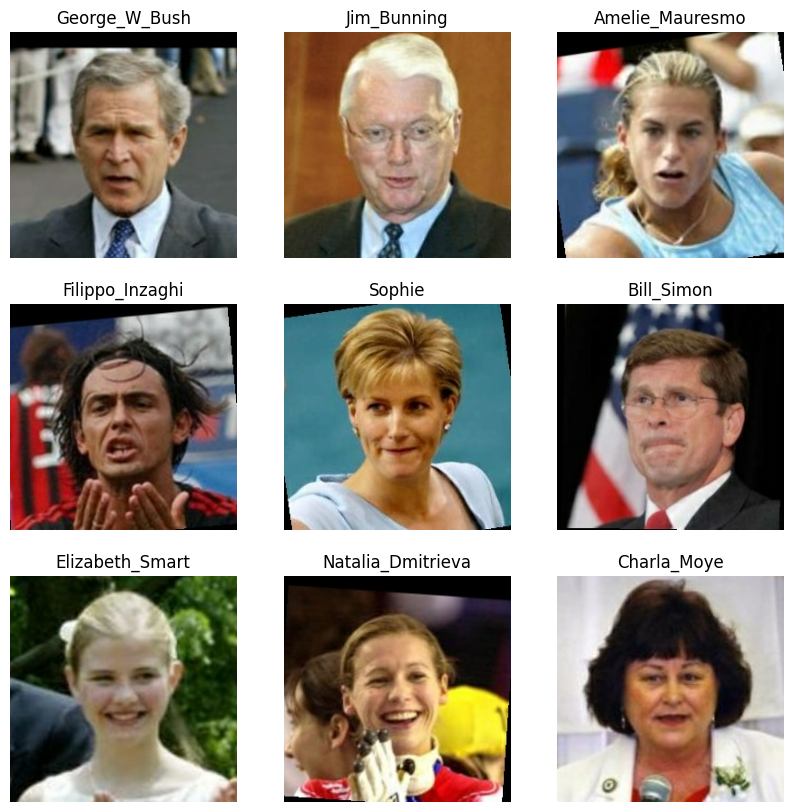

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)



In [ ]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break



(32, 250, 250, 3)
(32,)


In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Rescaling(1./255, input_shape= (250, 250, 3) ),
    layers.Conv2D(16, (3, 3), activation='sigmoid'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, (3, 3), activation='sigmoid'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='sigmoid'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='sigmoid'),
    layers.Dense(num_classes)
])


d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 250, 250, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 248, 248, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 124, 124, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 122, 122, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 61, 61, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 59, 59, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 53824)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     6,889,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5749)           │       741,621 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,654,805 (29.20 MB)

 Trainable params: 7,654,805 (29.20 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 129s 384ms/step - accuracy: 0.0265 - loss: 8.6054 - val_accuracy: 0.0457 - val_loss: 8.6988
Epoch 2/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 138s 415ms/step - accuracy: 0.0387 - loss: 7.9652 - val_accuracy: 0.0457 - val_loss: 9.0776
Epoch 3/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 137s 413ms/step - accuracy: 0.0403 - loss: 7.8556 - val_accuracy: 0.0457 - val_loss: 9.3175
Epoch 4/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 136s 411ms/step - accuracy: 0.0388 - loss: 7.8670 - val_accuracy: 0.0457 - val_loss: 9.4980
Epoch 5/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 133s 401ms/step - accuracy: 0.0403 - loss: 7.8666 - val_accuracy: 0.0457 - val_loss: 9.6236
Epoch 6/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 133s 403ms/step - accuracy: 0.0383 - loss: 7.8732 - val_accuracy: 0.0457 - val_loss: 9.7345
Epoch 7/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 136s 411ms/step - accuracy: 0.0396 - loss: 7.8705 - val_accuracy: 0.0457 - val_loss: 9.8284
Epoch 8/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 129s 389ms/step - accuracy: 0.0367 -

In [ ]:
model2 = Sequential([
    layers.Rescaling(1./255, input_shape= (250, 250, 3) ),
    layers.Conv2D(16, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(num_classes)
])

d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model2.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 250, 250, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 248, 248, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 124, 124, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 122, 122, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 61, 61, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 59, 59, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 53824)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │     3,444,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5749)           │       373,685 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,842,069 (14.66 MB)

 Trainable params: 3,842,069 (14.66 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model2.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 4
)


Epoch 1/4
331/331 ━━━━━━━━━━━━━━━━━━━━ 138s 408ms/step - accuracy: 0.0340 - loss: 8.3323 - val_accuracy: 0.0457 - val_loss: 8.0480
Epoch 2/4
331/331 ━━━━━━━━━━━━━━━━━━━━ 136s 411ms/step - accuracy: 0.0388 - loss: 7.6915 - val_accuracy: 0.0480 - val_loss: 8.1245
Epoch 3/4
331/331 ━━━━━━━━━━━━━━━━━━━━ 139s 420ms/step - accuracy: 0.0404 - loss: 7.3916 - val_accuracy: 0.0605 - val_loss: 8.2677
Epoch 4/4
331/331 ━━━━━━━━━━━━━━━━━━━━ 134s 406ms/step - accuracy: 0.0608 - loss: 7.0376 - val_accuracy: 0.0760 - val_loss: 8.3988


Connected to venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib


In [ ]:
dataset_urls = "file:\\D:\\Pygame projects\\DATH_TTNT\\Pins_face_recog.zip"
archive = tf.keras.utils.get_file('Pins_face_recog', origin=dataset_urls, extract=True)
data_dir = pathlib.Path(archive).with_suffix('')


389784397/389784397 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
dataset_urls = "file:\\D:\\Pygame projects\\DATH_TTNT\\Pins_face_recog.zip"
archive = tf.keras.utils.get_file('Pins_face_recog.zip', origin=dataset_urls, extract=True)
data_dir = pathlib.Path(archive).with_suffix('')

389784397/389784397 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
data_dir


WindowsPath('C:/Users/Admin/.keras/datasets/Pins_face_recog')

In [ ]:
img_height = 250
img_width = 250
batch_size = 32


In [ ]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)


0


In [ ]:
dataset_urls = "file:\\D:\\Pygame projects\\DATH_TTNT\\lfw-funneled.tgz"
archive = tf.keras.utils.get_file('lfw_funneled.tgz', origin=dataset_urls, extract=True)
data_dir = pathlib.Path(archive).with_suffix('')


In [ ]:
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
img_height = 224
img_width = 224
batch_size = 32


In [ ]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

AttributeError: 'str' object has no attribute 'glob'

In [ ]:
data_dir = pathlib.Path("Bird_recog")
img_height = 224
img_width = 224
batch_size = 32

image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

0


In [ ]:
data_dir

WindowsPath('Bird_recog')

In [ ]:
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
data_dir = pathlib.Path(data_dir).with_suffix('')
img_height = 224
img_width = 224
batch_size = 32

image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)


0


In [ ]:
data_dir

WindowsPath('D:/Pygame projects/DATH_TTNT/Bird_recog')

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

TypeError: unsupported operand type(s) for +: 'WindowsPath' and 'str'

In [ ]:
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)


ValueError: If `subset` is set, `validation_split` must be set, and inversely.

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 84635 files belonging to 525 classes.


In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)


Found 2625 files belonging to 525 classes.


In [ ]:
class_names = train_ds.class_names

In [ ]:
class_names

['ABBOTTS BABBLER',
 'ABBOTTS BOOBY',
 'ABYSSINIAN GROUND HORNBILL',
 'AFRICAN CROWNED CRANE',
 'AFRICAN EMERALD CUCKOO',
 'AFRICAN FIREFINCH',
 'AFRICAN OYSTER CATCHER',
 'AFRICAN PIED HORNBILL',
 'AFRICAN PYGMY GOOSE',
 'ALBATROSS',
 'ALBERTS TOWHEE',
 'ALEXANDRINE PARAKEET',
 'ALPINE CHOUGH',
 'ALTAMIRA YELLOWTHROAT',
 'AMERICAN AVOCET',
 'AMERICAN BITTERN',
 'AMERICAN COOT',
 'AMERICAN DIPPER',
 'AMERICAN FLAMINGO',
 'AMERICAN GOLDFINCH',
 'AMERICAN KESTREL',
 'AMERICAN PIPIT',
 'AMERICAN REDSTART',
 'AMERICAN ROBIN',
 'AMERICAN WIGEON',
 'AMETHYST WOODSTAR',
 'ANDEAN GOOSE',
 'ANDEAN LAPWING',
 'ANDEAN SISKIN',
 'ANHINGA',
 'ANIANIAU',
 'ANNAS HUMMINGBIRD',
 'ANTBIRD',
 'ANTILLEAN EUPHONIA',
 'APAPANE',
 'APOSTLEBIRD',
 'ARARIPE MANAKIN',
 'ASHY STORM PETREL',
 'ASHY THRUSHBIRD',
 'ASIAN CRESTED IBIS',
 'ASIAN DOLLARD BIRD',
 'ASIAN GREEN BEE EATER',
 'ASIAN OPENBILL STORK',
 'AUCKLAND SHAQ',
 'AUSTRAL CANASTERO',
 'AUSTRALASIAN FIGBIRD',
 'AVADAVAT',
 'AZARAS SPINETAIL',
 'AZURE 

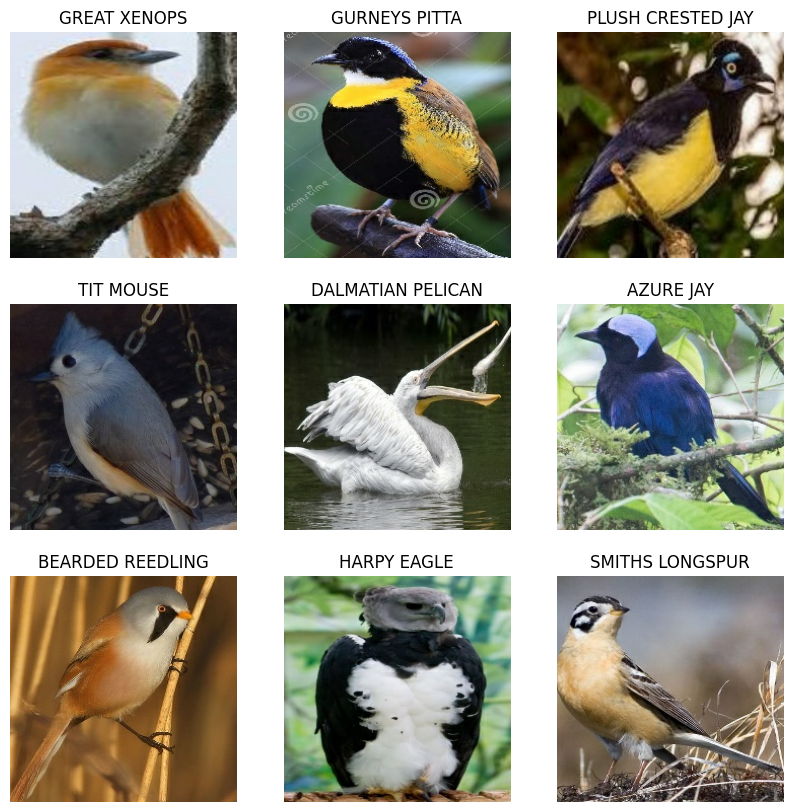

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)


In [ ]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break


(32, 224, 224, 3)
(32,)


In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Rescaling(1./255, input_shape= (224, 224, 3) ),
    # First Convolution layers
    layers.Conv2D(filters=96, kernel_size=(11, 11), strides=4, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Second Convolution layers
    layers.Conv2D(filters=256, kernel_size=(5, 5), strides=4, padding=2, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Third Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, padding=1, activation='relu'),
    # Fourth Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, padding=1, activation='relu'),
    # Fifth Convolution layers
    layers.Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding=1, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # First Dropout layers
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    # Second Dropout layers
    layers.Dropout(0.5),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='relu')
])


d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


AttributeError: 'int' object has no attribute 'lower'

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Rescaling(1./255, input_shape= (224, 224, 3) ),
    # First Convolution layers
    layers.Conv2D(filters=96, kernel_size=(11, 11), strides=4, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Second Convolution layers
    layers.Conv2D(filters=256, kernel_size=(5, 5), strides=4, padding='valid', activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Third Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, padding='valid', activation='relu'),
    # Fourth Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, padding='valid', activation='relu'),
    # Fifth Convolution layers
    layers.Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding='valid', activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # First Dropout layers
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    # Second Dropout layers
    layers.Dropout(0.5),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='relu')
])


ValueError: Computed output size would be negative. Received `inputs shape=(None, 0, 0, 384)`, `kernel shape=(3, 3, 384, 384)`, `dilation_rate=[1 1]`.

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Rescaling(1./255, input_shape= (224, 224, 3) ),
    # First Convolution layers
    layers.Conv2D(filters=96, kernel_size=(11, 11), strides=4, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Second Convolution layers
    layers.Conv2D(filters=256, kernel_size=(5, 5), strides=4, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Third Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # Fourth Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # Fifth Convolution layers
    layers.Conv2D(filters=256, kernel_size=(3, 3), strides=1, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # First Dropout layers
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    # Second Dropout layers
    layers.Dropout(0.5),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='relu')
])


ValueError: Computed output size would be negative. Received `inputs shape=(None, 0, 0, 384)`, `kernel shape=(3, 3, 384, 384)`, `dilation_rate=[1 1]`.

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Rescaling(1./255, input_shape= (224, 224, 3) ),
    # First Convolution layers
    layers.Conv2D(filters=96, kernel_size=(11, 11), strides=4, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Second Convolution layers
    layers.Conv2D(filters=256, kernel_size=(5, 5), strides=1, padding=2, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Third Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, padding=1, activation='relu'),
    # Fourth Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, padding=1, activation='relu'),
    # Fifth Convolution layers
    layers.Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding=1, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # First Dropout layers
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    # Second Dropout layers
    layers.Dropout(0.5),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='relu')
])


AttributeError: 'int' object has no attribute 'lower'

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Rescaling(1./255, input_shape= (224, 224, 3) ),
    # First Convolution layers
    layers.Conv2D(filters=96, kernel_size=(11, 11), strides=4, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Second Convolution layers
    layers.Conv2D(filters=256, kernel_size=(5, 5), strides=1, padding=1, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Third Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, padding=1, activation='relu'),
    # Fourth Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, padding=1, activation='relu'),
    # Fifth Convolution layers
    layers.Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding=1, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # First Dropout layers
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    # Second Dropout layers
    layers.Dropout(0.5),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='relu')
])


AttributeError: 'int' object has no attribute 'lower'

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Rescaling(1./255, input_shape= (224, 224, 3) ),
    # First Convolution layers
    layers.Conv2D(filters=96, kernel_size=(11, 11), strides=4, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Second Convolution layers
    layers.Conv2D(filters=256, kernel_size=(5, 5), strides=1, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Third Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # Fourth Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # Fifth Convolution layers
    layers.Conv2D(filters=256, kernel_size=(3, 3), strides=1, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # First Dropout layers
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    # Second Dropout layers
    layers.Dropout(0.5),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='relu')
])


In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_5 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 54, 54, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 26, 26, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 22, 22, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 10, 10, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 8, 8, 384)      │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 6, 6, 384)      │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 4, 4, 256)      │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 1, 1, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1, 1, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4096)           │     1,052,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 525)            │     2,150,925 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,732,109 (90.53 MB)

 Trainable params: 23,732,109 (90.53 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 3
)

Epoch 1/3
 668/2645 ━━━━━━━━━━━━━━━━━━━━ 15:50 481ms/step - accuracy: 0.0018 - loss: 6.2634

: 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib


Restarted venv (Python 3.11.0)

In [ ]:
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"

In [ ]:
img_height = 224
img_width = 224
batch_size = 32


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


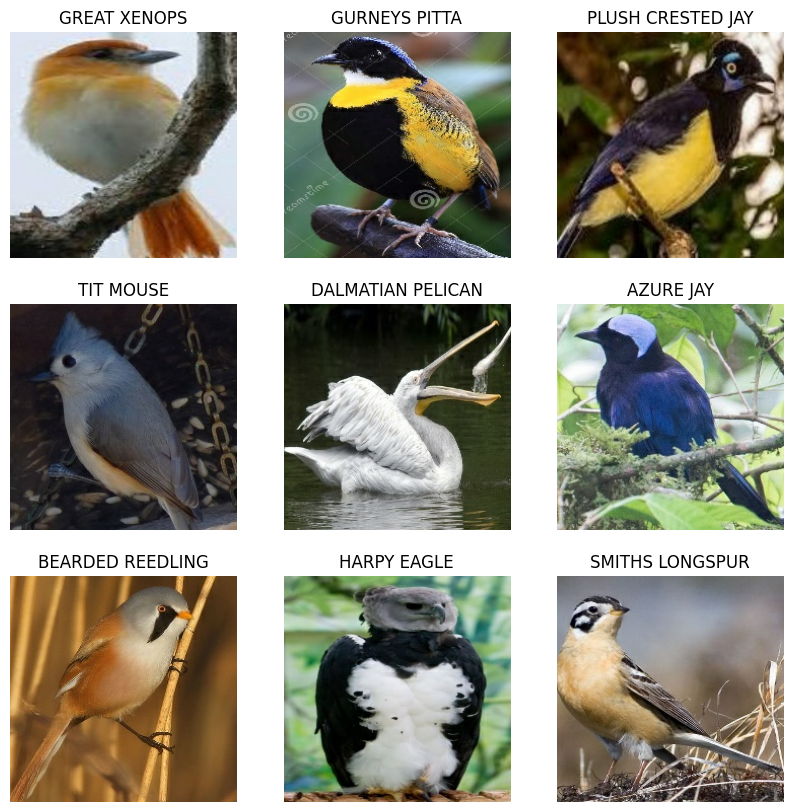

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)


In [ ]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break


(32, 224, 224, 3)
(32,)


In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Rescaling(1./255, input_shape= (224, 224, 3) ),
    # First Convolution layers
    layers.Conv2D(filters=96, kernel_size=(11, 11), strides=4, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Second Convolution layers
    layers.Conv2D(filters=256, kernel_size=(5, 5), strides=1, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # Third Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # Fourth Convolution layers
    layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # Fifth Convolution layers
    layers.Conv2D(filters=256, kernel_size=(3, 3), strides=1, activation='relu'),
    layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # First Dropout layers
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    # Second Dropout layers
    layers.Dropout(0.5),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='relu')
])


d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 54, 54, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 26, 26, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 22, 22, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 10, 10, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 384)      │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 6, 6, 384)      │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 4, 4, 256)      │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 1, 1, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1, 1, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4096)           │     1,052,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 525)            │     2,150,925 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,732,109 (90.53 MB)

 Trainable params: 23,732,109 (90.53 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 3
)


Epoch 1/3
 961/2645 ━━━━━━━━━━━━━━━━━━━━ 13:32 483ms/step - accuracy: 0.0016 - loss: 6.2634

ResourceExhaustedError: Graph execution error:

Detected at node adam/Sub_50 defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\ipykernel_launcher.py", line 18, in <module>

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\ipykernel\kernelapp.py", line 739, in start

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\tornado\platform\asyncio.py", line 205, in start

  File "C:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\asyncio\base_events.py", line 604, in run_forever

  File "C:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\asyncio\base_events.py", line 1909, in _run_once

  File "C:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\asyncio\events.py", line 80, in _run

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\ipykernel\kernelbase.py", line 545, in dispatch_queue

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\ipykernel\kernelbase.py", line 534, in process_one

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\ipykernel\kernelbase.py", line 437, in dispatch_shell

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\ipykernel\ipkernel.py", line 359, in execute_request

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\ipykernel\kernelbase.py", line 778, in execute_request

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\ipykernel\ipkernel.py", line 446, in do_execute

  File "C:\Users\Admin\AppData\Local\Temp\ipykernel_6864\4080754994.py", line 29, in wrapper

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\ipykernel\zmqshell.py", line 549, in run_cell

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\IPython\core\interactiveshell.py", line 3075, in run_cell

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\IPython\core\interactiveshell.py", line 3130, in _run_cell

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\IPython\core\interactiveshell.py", line 3334, in run_cell_async

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\IPython\core\interactiveshell.py", line 3517, in run_ast_nodes

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\IPython\core\interactiveshell.py", line 3577, in run_code

  File "<ipython-input-11-c3ab70ae494b>", line 1, in <module>

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\utils\traceback_utils.py", line 117, in error_handler

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\backend\tensorflow\trainer.py", line 325, in fit

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\backend\tensorflow\trainer.py", line 118, in one_step_on_iterator

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\backend\tensorflow\trainer.py", line 106, in one_step_on_data

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\backend\tensorflow\trainer.py", line 73, in train_step

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\optimizers\base_optimizer.py", line 269, in apply_gradients

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\optimizers\base_optimizer.py", line 330, in apply

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\optimizers\base_optimizer.py", line 380, in _backend_apply_gradients

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\backend\tensorflow\optimizer.py", line 117, in _backend_update_step

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\backend\tensorflow\optimizer.py", line 131, in _distributed_tf_update_step

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\backend\tensorflow\optimizer.py", line 128, in apply_grad_to_update_var

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\optimizers\adam.py", line 129, in update_step

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\ops\numpy.py", line 5475, in subtract

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\backend\tensorflow\sparse.py", line 491, in sparse_wrapper

  File "d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\backend\tensorflow\numpy.py", line 271, in subtract

OOM when allocating tensor with shape[4096,4096] and type float on /job:localhost/replica:0/task:0/device:CPU:0 by allocator mklcpu
	 [[{{node adam/Sub_50}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_one_step_on_iterator_3085]

Connected to venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

# print("Check TensorFlow:", tf.__version__)
# print("Check Keras:", kr.__version__)
# dataset_urls = "file:\\D:\\Pygame projects\\DATH_TTNT\\lfw-funneled.tgz"
# archive = tf.keras.utils.get_file('lfw_funneled.tgz', origin=dataset_urls, extract=True)
# data_dir = pathlib.Path(archive).with_suffix('')

# dataset directory
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
data_dir = pathlib.Path(data_dir).with_suffix('')
img_height = 224
img_width = 224
batch_size = 32


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


TypeError: unsupported operand type(s) for +: 'WindowsPath' and 'str'

Restarted venv (Python 3.11.0)

In [ ]:
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
# data_dir = pathlib.Path(data_dir).with_suffix('')
img_height = 224
img_width = 224
batch_size = 32


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


NameError: name 'tf' is not defined

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


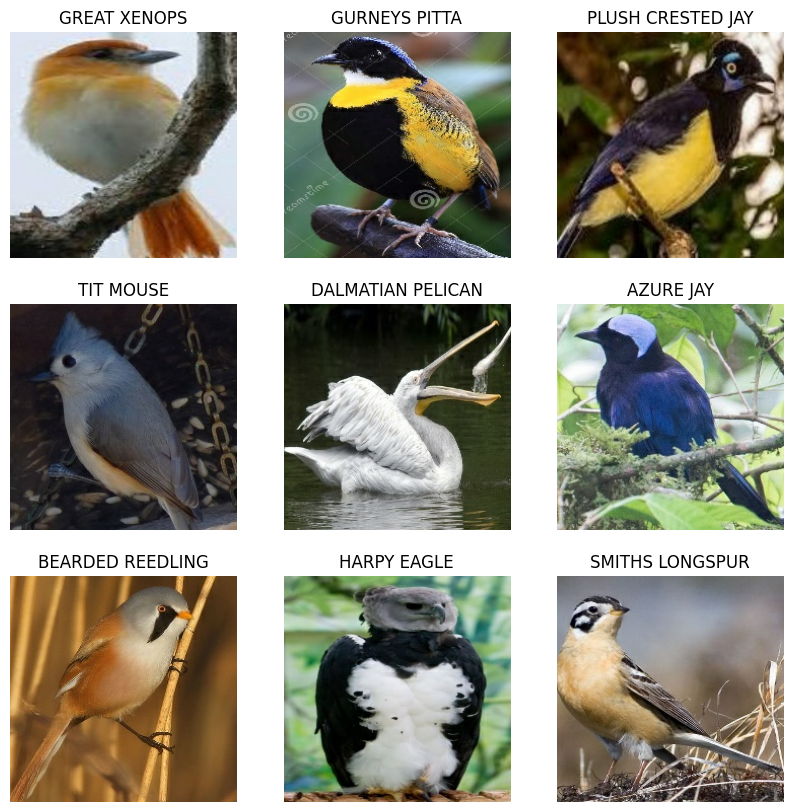

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(32, 32, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
    
    # AlexNet architecture - too complicated
    # # First Convolution layers
    # layers.Conv2D(filters=96, kernel_size=(11, 11), strides=4, activation='relu'),
    # layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # # Second Convolution layers
    # layers.Conv2D(filters=256, kernel_size=(5, 5), strides=1, activation='relu'),
    # layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # # Third Convolution layers
    # layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # # Fourth Convolution layers
    # layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # # Fifth Convolution layers
    # layers.Conv2D(filters=256, kernel_size=(3, 3), strides=1, activation='relu'),
    # layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # # First Dropout layers
    # layers.Dropout(0.5),
    # layers.Flatten(),
    # layers.Dense(4096, activation='relu'),
    # # Second Dropout layers
    # layers.Dropout(0.5),
    # layers.Dense(4096, activation='relu'),
    # layers.Dense(num_classes, activation='relu')
    
    # Lenet-5 architecture
    # 
    
])


d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing (Resizing)             │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 32, 32, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 222,509 (869.18 KB)

 Trainable params: 222,509 (869.18 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 74s 27ms/step - accuracy: 0.0269 - loss: 5.6958 - val_accuracy: 0.1794 - val_loss: 3.9746
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 36s 14ms/step - accuracy: 0.1919 - loss: 3.9585 - val_accuracy: 0.3211 - val_loss: 3.1461
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 37s 14ms/step - accuracy: 0.2990 - loss: 3.2930 - val_accuracy: 0.4057 - val_loss: 2.6855
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 37s 14ms/step - accuracy: 0.3656 - loss: 2.9202 - val_accuracy: 0.4358 - val_loss: 2.5216
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 36s 14ms/step - accuracy: 0.4125 - loss: 2.6724 - val_accuracy: 0.4564 - val_loss: 2.4672
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 36s 14ms/step - accuracy: 0.4448 - loss: 2.4911 - val_accuracy: 0.4823 - val_loss: 2.2782
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 36s 14ms/step - accuracy: 0.4713 - loss: 2.3447 - val_accuracy: 0.4891 - val_loss: 2.2200
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 37s 14ms/step - accuracy: 0.4911 -

In [ ]:
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
    
    # AlexNet architecture - too complicated
    # # First Convolution layers
    # layers.Conv2D(filters=96, kernel_size=(11, 11), strides=4, activation='relu'),
    # layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # # Second Convolution layers
    # layers.Conv2D(filters=256, kernel_size=(5, 5), strides=1, activation='relu'),
    # layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # # Third Convolution layers
    # layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # # Fourth Convolution layers
    # layers.Conv2D(filters=384, kernel_size=(3, 3), strides=1, activation='relu'),
    # # Fifth Convolution layers
    # layers.Conv2D(filters=256, kernel_size=(3, 3), strides=1, activation='relu'),
    # layers.MaxPooling2D(pool_size=(3, 3), strides=2),
    # # First Dropout layers
    # layers.Dropout(0.5),
    # layers.Flatten(),
    # layers.Dense(4096, activation='relu'),
    # # Second Dropout layers
    # layers.Dropout(0.5),
    # layers.Dense(4096, activation='relu'),
    # layers.Dense(num_classes, activation='relu')
    
    # Lenet-5 architecture
    # 
    
])


d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_1 (Resizing)           │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     1,605,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,697,069 (6.47 MB)

 Trainable params: 1,697,069 (6.47 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 255s 95ms/step - accuracy: 0.0530 - loss: 5.4703 - val_accuracy: 0.3265 - val_loss: 3.1780
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 289s 109ms/step - accuracy: 0.3175 - loss: 3.2482 - val_accuracy: 0.4648 - val_loss: 2.3965
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 305s 115ms/step - accuracy: 0.4875 - loss: 2.2755 - val_accuracy: 0.5158 - val_loss: 2.1904
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 287s 108ms/step - accuracy: 0.5989 - loss: 1.7042 - val_accuracy: 0.5310 - val_loss: 2.1924
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 277s 105ms/step - accuracy: 0.6865 - loss: 1.2800 - val_accuracy: 0.5299 - val_loss: 2.4916
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 267s 101ms/step - accuracy: 0.7604 - loss: 0.9382 - val_accuracy: 0.5208 - val_loss: 2.8367
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 286s 108ms/step - accuracy: 0.8157 - loss: 0.6858 - val_accuracy: 0.5139 - val_loss: 3.3299
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 285s 108ms/step - acc

In [ ]:
tf.version

<module 'tensorflow._api.v2.version' from 'd:\\Pygame projects\\DATH_TTNT\\venv\\Lib\\site-packages\\tensorflow\\_api\\v2\\version\\__init__.py'>

In [ ]:
tf.__version__

'2.16.1'

Connected to venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
img_height = 224
img_width = 224
batch_size = 32


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


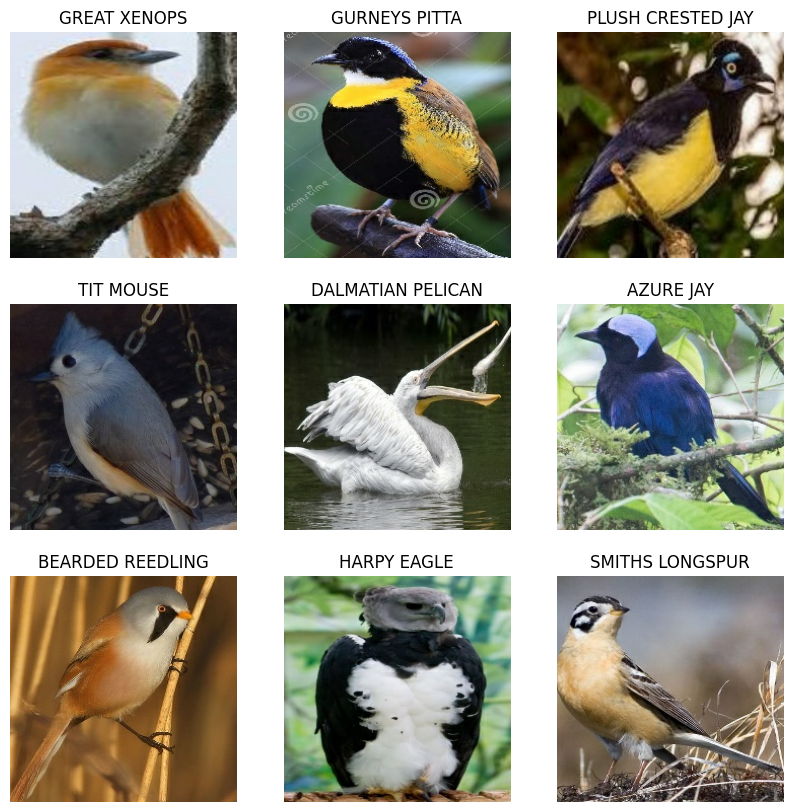

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing (Resizing)             │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 112, 112, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 56, 56, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,605,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,697,069 (6.47 MB)

 Trainable params: 1,697,069 (6.47 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 307s 115ms/step - accuracy: 0.0473 - loss: 5.5723 - val_accuracy: 0.3131 - val_loss: 3.1988
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 262s 99ms/step - accuracy: 0.3208 - loss: 3.2259 - val_accuracy: 0.4697 - val_loss: 2.3752
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 259s 98ms/step - accuracy: 0.4652 - loss: 2.3851 - val_accuracy: 0.5040 - val_loss: 2.1617
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 261s 99ms/step - accuracy: 0.5600 - loss: 1.9024 - val_accuracy: 0.4960 - val_loss: 2.2574
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 259s 98ms/step - accuracy: 0.6282 - loss: 1.5482 - val_accuracy: 0.5116 - val_loss: 2.4400
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 260s 98ms/step - accuracy: 0.6913 - loss: 1.2517 - val_accuracy: 0.5131 - val_loss: 2.5624
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 266s 100ms/step - accuracy: 0.7420 - loss: 1.0141 - val_accuracy: 0.5032 - val_loss: 2.7854
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 262s 99ms/step - accuracy

Connected to venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
img_height = 224
img_width = 224
batch_size = 32


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


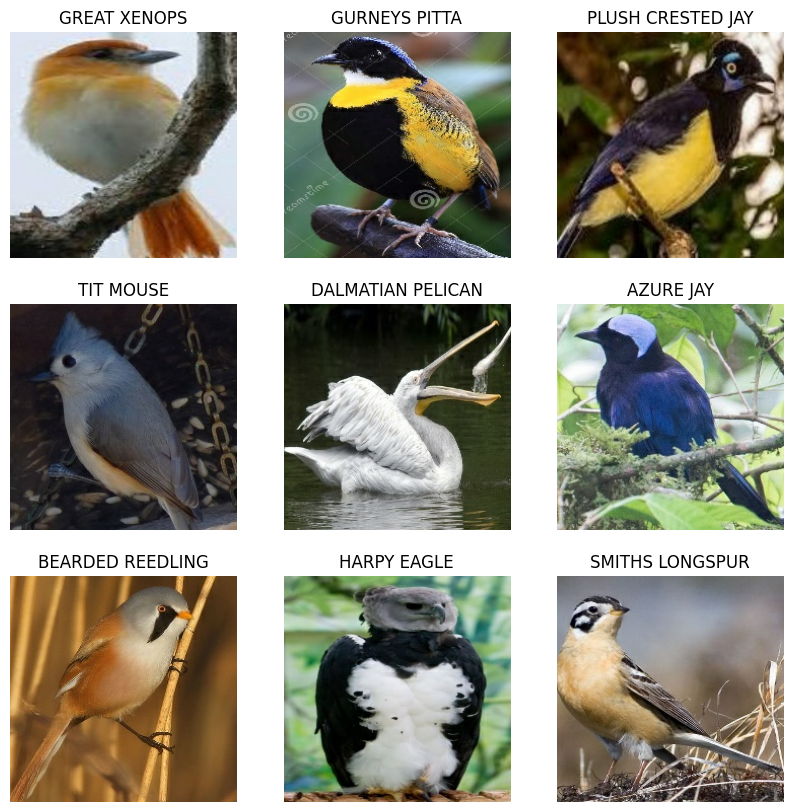

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing (Resizing)             │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 112, 112, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 56, 56, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,605,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,697,069 (6.47 MB)

 Trainable params: 1,697,069 (6.47 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 233s 87ms/step - accuracy: 0.0538 - loss: 5.4120 - val_accuracy: 0.3230 - val_loss: 3.2164
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 216s 82ms/step - accuracy: 0.3099 - loss: 3.2446 - val_accuracy: 0.4636 - val_loss: 2.3636
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 209s 79ms/step - accuracy: 0.4550 - loss: 2.4452 - val_accuracy: 0.5029 - val_loss: 2.1784
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 210s 79ms/step - accuracy: 0.5393 - loss: 1.9902 - val_accuracy: 0.5272 - val_loss: 2.0945
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 207s 78ms/step - accuracy: 0.6082 - loss: 1.6416 - val_accuracy: 0.5326 - val_loss: 2.2352
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 214s 81ms/step - accuracy: 0.6642 - loss: 1.3686 - val_accuracy: 0.5211 - val_loss: 2.3773
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 216s 82ms/step - accuracy: 0.7135 - loss: 1.1373 - val_accuracy: 0.5154 - val_loss: 2.5012
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 195s 74ms/step - accuracy: 

No kernel connected

No kernel connected

Connected to venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
img_height = 224
img_width = 224
batch_size = 32


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


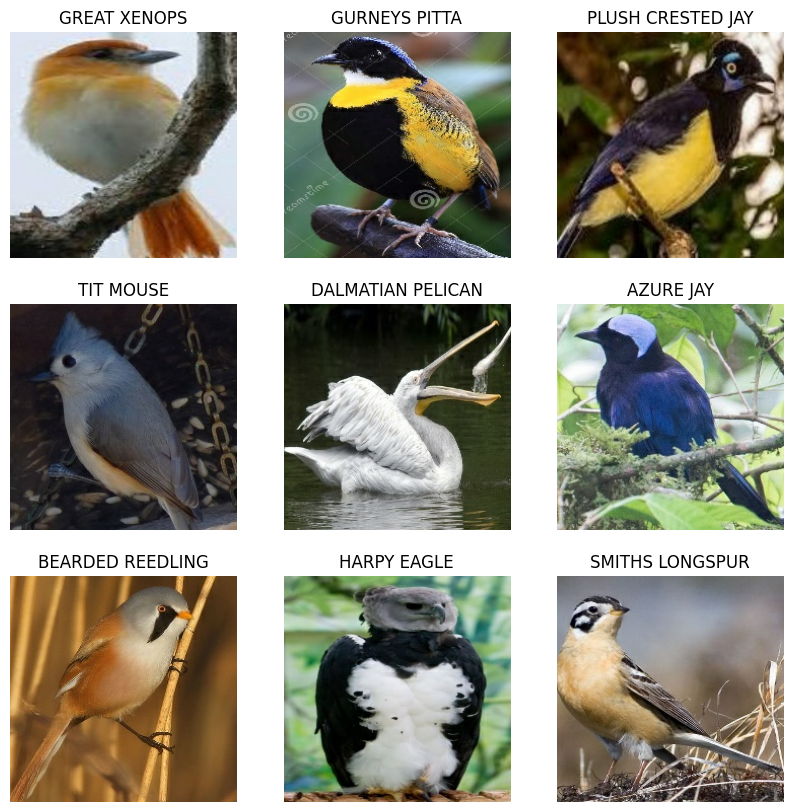

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing (Resizing)             │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 112, 112, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 56, 56, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,605,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,697,069 (6.47 MB)

 Trainable params: 1,697,069 (6.47 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 255s 96ms/step - accuracy: 0.0395 - loss: 5.5502 - val_accuracy: 0.2568 - val_loss: 3.4866
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 208s 78ms/step - accuracy: 0.2694 - loss: 3.4906 - val_accuracy: 0.4050 - val_loss: 2.6919
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 192s 73ms/step - accuracy: 0.3853 - loss: 2.7846 - val_accuracy: 0.4663 - val_loss: 2.3207
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 193s 73ms/step - accuracy: 0.4522 - loss: 2.4110 - val_accuracy: 0.4952 - val_loss: 2.2342
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 180s 68ms/step - accuracy: 0.5031 - loss: 2.1432 - val_accuracy: 0.5147 - val_loss: 2.2006
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 177s 67ms/step - accuracy: 0.5440 - loss: 1.9281 - val_accuracy: 0.5147 - val_loss: 2.1868
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 176s 66ms/step - accuracy: 0.5794 - loss: 1.7391 - val_accuracy: 0.5181 - val_loss: 2.2148
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 241s 91ms/step - accuracy: 

Connected to venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
img_height = 224
img_width = 224
batch_size = 32


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


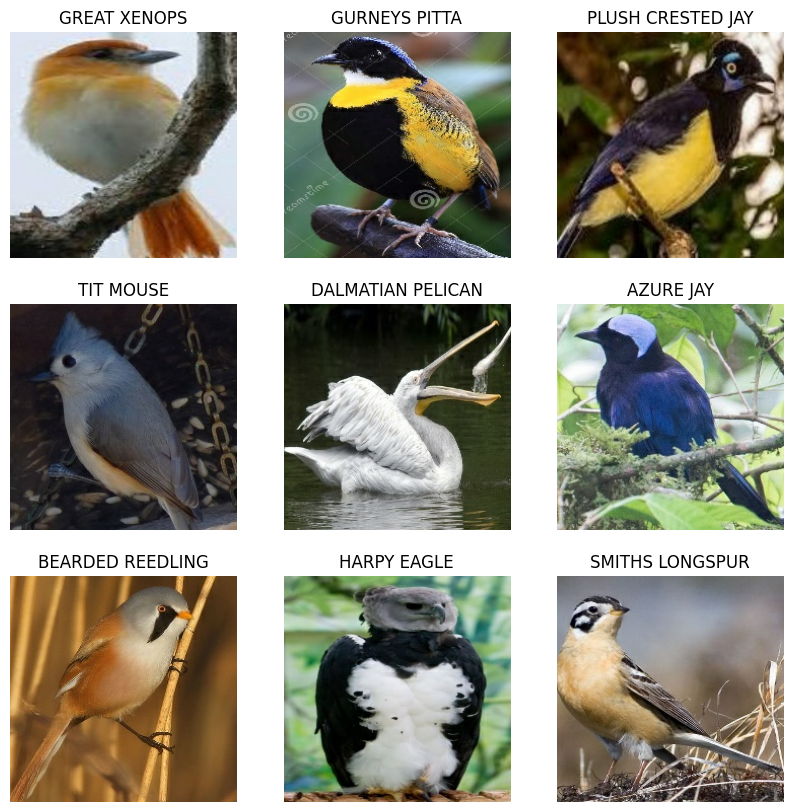

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing (Resizing)             │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 112, 112, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 56, 56, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,605,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,697,069 (6.47 MB)

 Trainable params: 1,697,069 (6.47 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 269s 101ms/step - accuracy: 0.0468 - loss: 5.5484 - val_accuracy: 0.3120 - val_loss: 3.1988
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 248s 94ms/step - accuracy: 0.3083 - loss: 3.2521 - val_accuracy: 0.4613 - val_loss: 2.4078
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 245s 93ms/step - accuracy: 0.4478 - loss: 2.4705 - val_accuracy: 0.5150 - val_loss: 2.1059
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 247s 93ms/step - accuracy: 0.5275 - loss: 2.0431 - val_accuracy: 0.5307 - val_loss: 2.0146
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 263s 99ms/step - accuracy: 0.5882 - loss: 1.7406 - val_accuracy: 0.5436 - val_loss: 2.1862
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 264s 99ms/step - accuracy: 0.6383 - loss: 1.4912 - val_accuracy: 0.5211 - val_loss: 2.2777
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 266s 100ms/step - accuracy: 0.6842 - loss: 1.2827 - val_accuracy: 0.5181 - val_loss: 2.4342
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 258s 98ms/step - accuracy

In [ ]:
model = Sequential([
    # Data preprocessing
    layers.Resizing(224, 224),
    layers.Rescaling(1./255),
    layers.experimental.preprocessing.RandomFlip("horizontal"),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
    layers.experimental.preprocessing.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

AttributeError: module 'keras._tf_keras.keras.layers' has no attribute 'experimental'

In [ ]:
model = Sequential([
    # Data preprocessing
    layers.Resizing(224, 224),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_2 (Resizing)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_2 (Rescaling)         │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation                 │ ?                      │   0 (unbuilt) │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom (RandomZoom)        │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast                 │ ?                      │   0 (unbuilt) │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model = Sequential([
    # Data preprocessing
    layers.Resizing(224, 224, input_shape=(224, 224, 3)),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])


In [ ]:
model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_3 (Resizing)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_3 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_1 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_1               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom_1 (RandomZoom)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_1               │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 224, 224, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 112, 112, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 56, 56, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │     6,422,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,513,965 (24.85 MB)

 Trainable params: 6,513,965 (24.85 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

In [ ]:
model = Sequential([
    # Data preprocessing
    layers.Resizing(112, 112, input_shape=(224, 224, 3)),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

In [ ]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_4 (Resizing)           │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_4 (Rescaling)         │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_2 (RandomFlip)      │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_2               │ (None, 112, 112, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom_2 (RandomZoom)      │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_2               │ (None, 112, 112, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 112, 112, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 56, 56, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │     1,605,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,697,069 (6.47 MB)

 Trainable params: 1,697,069 (6.47 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    layers.experimental.preprocessing.RandomFlip("horizontal"),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
    layers.experimental.preprocessing.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

AttributeError: module 'keras._tf_keras.keras.layers' has no attribute 'experimental'

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_6 (Resizing)           │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_6 (Rescaling)         │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_3 (RandomFlip)      │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_3               │ (None, 112, 112, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom_3 (RandomZoom)      │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_3               │ (None, 112, 112, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 112, 112, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 56, 56, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │     1,605,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,697,069 (6.47 MB)

 Trainable params: 1,697,069 (6.47 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # layers.RandomFlip("horizontal"),
    # layers.RandomRotation(0.1),
    # layers.RandomZoom(0.1),
    # layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

In [ ]:
# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 179s 67ms/step - accuracy: 0.0452 - loss: 5.5097 - val_accuracy: 0.2914 - val_loss: 3.3328
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 173s 65ms/step - accuracy: 0.2845 - loss: 3.4014 - val_accuracy: 0.4373 - val_loss: 2.5188
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 179s 68ms/step - accuracy: 0.4253 - loss: 2.5814 - val_accuracy: 0.4968 - val_loss: 2.2473
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 181s 68ms/step - accuracy: 0.5156 - loss: 2.1087 - val_accuracy: 0.5101 - val_loss: 2.2119
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 173s 66ms/step - accuracy: 0.5835 - loss: 1.7605 - val_accuracy: 0.5215 - val_loss: 2.2261
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 181s 68ms/step - accuracy: 0.6391 - loss: 1.4839 - val_accuracy: 0.5219 - val_loss: 2.2898
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 177s 67ms/step - accuracy: 0.6858 - loss: 1.2512 - val_accuracy: 0.5200 - val_loss: 2.4841
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 176s 67ms/step - accuracy: 

Restarted venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
# dataset directory
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
# data_dir = pathlib.Path(data_dir).with_suffix('')
img_height = 224
img_width = 224
batch_size = 32

# image_count = len(list(data_dir.glob('*/*.jpg')))
# print(image_count)
# print(data_dir)
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=42,
    color_mode='rbg',
    class_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\test",
    seed=42,
    color_mode='rbg',
    class_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
predict_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=42,
    color_mode='rbg',
    class_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names

TypeError: image_dataset_from_directory() got an unexpected keyword argument 'class_mode'

In [ ]:
# dataset directory
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
# data_dir = pathlib.Path(data_dir).with_suffix('')
img_height = 224
img_width = 224
batch_size = 32

# image_count = len(list(data_dir.glob('*/*.jpg')))
# print(image_count)
# print(data_dir)
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=42,
    color_mode='rbg',
    label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\test",
    seed=42,
    color_mode='rbg',
    label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
predict_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=42,
    color_mode='rbg',
    label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


ValueError: `color_mode` must be one of {"rgb", "rgba", "grayscale"}. Received: color_mode=rbg

In [ ]:
# dataset directory
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
# data_dir = pathlib.Path(data_dir).with_suffix('')
img_height = 224
img_width = 224
batch_size = 32

# image_count = len(list(data_dir.glob('*/*.jpg')))
# print(image_count)
# print(data_dir)
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=42,
    color_mode='rgb',
    label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\test",
    seed=42,
    color_mode='rgb',
    label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
predict_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=42,
    color_mode='rgb',
    label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names

Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


TypeError: only integer scalar arrays can be converted to a scalar index

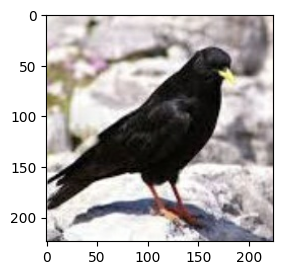

In [ ]:
# Visualize data
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

Restarted venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
# dataset directory
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
# data_dir = pathlib.Path(data_dir).with_suffix('')
img_height = 224
img_width = 224
batch_size = 32

# image_count = len(list(data_dir.glob('*/*.jpg')))
# print(image_count)
# print(data_dir)
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=42,
    color_mode='rgb',
    # label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\test",
    seed=42,
    color_mode='rgb',
    # label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
predict_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=42,
    color_mode='rgb',
    # label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names


Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


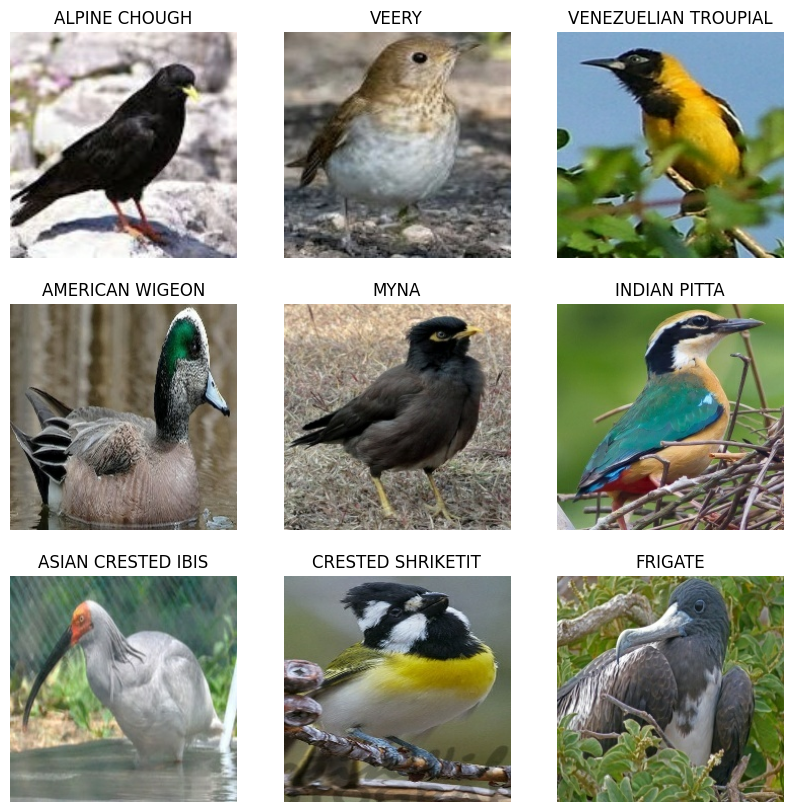

In [ ]:
# Visualize data
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


In [ ]:
num_classes = len(class_names)
model = Sequential([
    # Data preprocessing
    layers.Resizing(224, 224, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing (Resizing)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation                 │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom (RandomZoom)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast                 │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     6,422,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,513,965 (24.85 MB)

 Trainable params: 6,513,965 (24.85 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

In [ ]:
num_classes = len(class_names)
model = Sequential([
    # Data preprocessing
    layers.Resizing(224, 224, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # layers.RandomFlip("horizontal"),
    # layers.RandomRotation(0.1),
    # layers.RandomZoom(0.1),
    # layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
    
])

In [ ]:
model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_1 (Resizing)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 224, 224, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 112, 112, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     6,422,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,513,965 (24.85 MB)

 Trainable params: 6,513,965 (24.85 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

In [ ]:
num_classes = len(class_names)
model = Sequential([
    # Data preprocessing
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # layers.RandomFlip("horizontal"),
    # layers.RandomRotation(0.1),
    # layers.RandomZoom(0.1),
    # layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
    
])

# Model summary
# model.summary()

# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

In [ ]:
num_classes = len(class_names)
model = Sequential([
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

Restarted venv (Python 3.11.0)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
# dataset directory
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
# data_dir = pathlib.Path(data_dir).with_suffix('')
img_height = 224
img_width = 224
batch_size = 32

# image_count = len(list(data_dir.glob('*/*.jpg')))
# print(image_count)
# print(data_dir)
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=42,
    color_mode='rgb',
    # label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\test",
    seed=42,
    color_mode='rgb',
    # label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
predict_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=42,
    color_mode='rgb',
    # label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names

Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


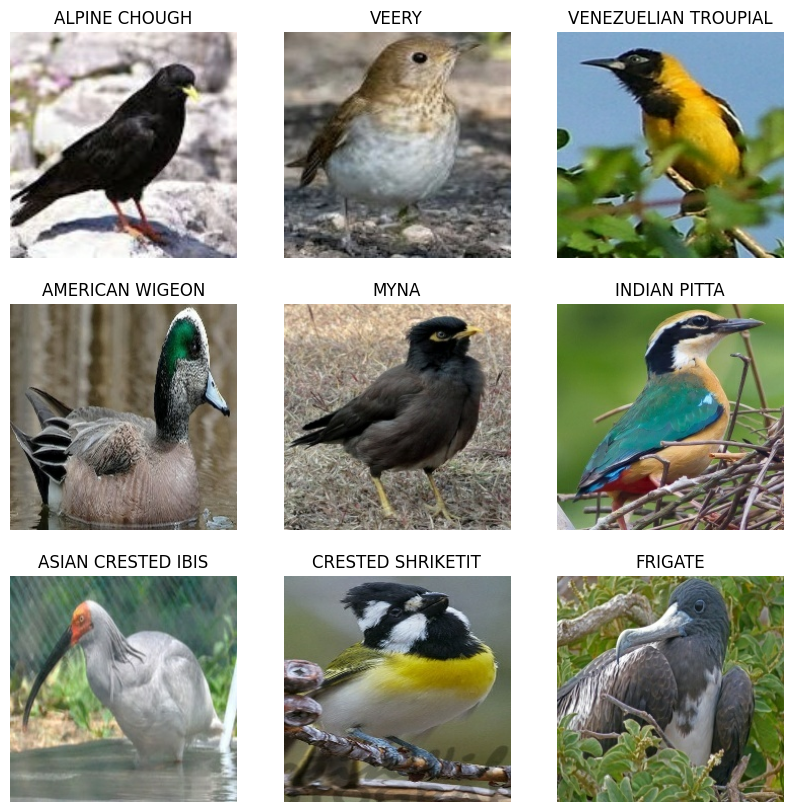

In [ ]:
# Visualize data
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [ ]:
num_classes = len(class_names)
model = Sequential([
    # Data preprocessing
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    # layers.RandomFlip("horizontal"),
    # layers.RandomRotation(0.1),
    # layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
    
])

d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing (Resizing)             │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 112, 112, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast                 │ (None, 112, 112, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 112, 112, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 56, 56, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,605,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 525)            │        67,725 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,697,069 (6.47 MB)

 Trainable params: 1,697,069 (6.47 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 525)

In [ ]:
# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 176s 66ms/step - accuracy: 0.0275 - loss: 5.7397 - val_accuracy: 0.2225 - val_loss: 3.6374
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 168s 64ms/step - accuracy: 0.2341 - loss: 3.7094 - val_accuracy: 0.3874 - val_loss: 2.6297
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 169s 64ms/step - accuracy: 0.3765 - loss: 2.8496 - val_accuracy: 0.4606 - val_loss: 2.2893
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 171s 65ms/step - accuracy: 0.4578 - loss: 2.3887 - val_accuracy: 0.4933 - val_loss: 2.1189
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 171s 65ms/step - accuracy: 0.5184 - loss: 2.0751 - val_accuracy: 0.5051 - val_loss: 2.0687
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 170s 64ms/step - accuracy: 0.5656 - loss: 1.8313 - val_accuracy: 0.5276 - val_loss: 2.0174
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 171s 65ms/step - accuracy: 0.6083 - loss: 1.6209 - val_accuracy: 0.5208 - val_loss: 2.1127
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 174s 66ms/step - accuracy: 

In [ ]:
num_classes = len(class_names)
model = Sequential([
    # Data preprocessing
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_classes)
    
])


d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 207s 77ms/step - accuracy: 0.0033 - loss: 6.2310 - val_accuracy: 0.0080 - val_loss: 5.8445
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 192s 72ms/step - accuracy: 0.0092 - loss: 5.8709 - val_accuracy: 0.0324 - val_loss: 5.4592
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 191s 72ms/step - accuracy: 0.0245 - loss: 5.5328 - val_accuracy: 0.0876 - val_loss: 4.8851
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 190s 72ms/step - accuracy: 0.0541 - loss: 5.1434 - val_accuracy: 0.1486 - val_loss: 4.3974
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 197s 74ms/step - accuracy: 0.0764 - loss: 4.8739 - val_accuracy: 0.1680 - val_loss: 4.2109
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 195s 74ms/step - accuracy: 0.0945 - loss: 4.6725 - val_accuracy: 0.2267 - val_loss: 3.8624
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 197s 75ms/step - accuracy: 0.1131 - loss: 4.5195 - val_accuracy: 0.2301 - val_loss: 3.7270
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 199s 75ms/step - accuracy: 

In [ ]:
# Create Keras model using Sequential
num_classes = len(class_names)
model = Sequential([
    # Data preprocessing
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.25),
    layers.Dense(num_classes)
    
])

In [ ]:
# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 219s 82ms/step - accuracy: 0.0152 - loss: 5.8680 - val_accuracy: 0.1390 - val_loss: 4.2745
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 186s 70ms/step - accuracy: 0.1146 - loss: 4.4884 - val_accuracy: 0.2705 - val_loss: 3.3023
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 186s 70ms/step - accuracy: 0.1978 - loss: 3.8696 - val_accuracy: 0.3817 - val_loss: 2.7618
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 186s 70ms/step - accuracy: 0.2453 - loss: 3.5365 - val_accuracy: 0.4278 - val_loss: 2.4643
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 198s 75ms/step - accuracy: 0.2816 - loss: 3.3317 - val_accuracy: 0.4453 - val_loss: 2.4352
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 206s 78ms/step - accuracy: 0.3042 - loss: 3.1631 - val_accuracy: 0.4922 - val_loss: 2.2261
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 201s 76ms/step - accuracy: 0.3248 - loss: 3.0636 - val_accuracy: 0.4804 - val_loss: 2.2366
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 207s 78ms/step - accuracy: 

In [ ]:
num_classes = len(class_names)
model = Sequential([
    # Data preprocessing
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.1),
    layers.Dense(num_classes)
    
])

# Model summary
# model.summary()

# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 289s 108ms/step - accuracy: 0.0194 - loss: 5.8346 - val_accuracy: 0.1806 - val_loss: 3.9334
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 273s 103ms/step - accuracy: 0.1527 - loss: 4.2029 - val_accuracy: 0.3158 - val_loss: 3.0482
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 263s 99ms/step - accuracy: 0.2423 - loss: 3.5890 - val_accuracy: 0.3855 - val_loss: 2.7287
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 269s 102ms/step - accuracy: 0.2964 - loss: 3.2497 - val_accuracy: 0.4453 - val_loss: 2.4343
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 265s 100ms/step - accuracy: 0.3303 - loss: 3.0565 - val_accuracy: 0.4491 - val_loss: 2.3908
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 290s 110ms/step - accuracy: 0.3548 - loss: 2.9080 - val_accuracy: 0.4804 - val_loss: 2.2226
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 295s 111ms/step - accuracy: 0.3776 - loss: 2.7878 - val_accuracy: 0.5204 - val_loss: 2.0592
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 307s 116ms/step - acc

In [ ]:
num_classes = len(class_names)
model = Sequential([
    # Data preprocessing
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.05),
    layers.Dense(num_classes)
    
])

# Model summary
# model.summary()

# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)


Epoch 1/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 287s 107ms/step - accuracy: 0.0404 - loss: 5.4861 - val_accuracy: 0.2446 - val_loss: 3.4602
Epoch 2/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 281s 106ms/step - accuracy: 0.2170 - loss: 3.7501 - val_accuracy: 0.3707 - val_loss: 2.7293
Epoch 3/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 291s 110ms/step - accuracy: 0.3221 - loss: 3.1468 - val_accuracy: 0.4541 - val_loss: 2.3561
Epoch 4/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 308s 116ms/step - accuracy: 0.3765 - loss: 2.8207 - val_accuracy: 0.4735 - val_loss: 2.2668
Epoch 5/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 268s 101ms/step - accuracy: 0.4146 - loss: 2.6163 - val_accuracy: 0.5349 - val_loss: 1.9642
Epoch 6/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 269s 102ms/step - accuracy: 0.4397 - loss: 2.4680 - val_accuracy: 0.5733 - val_loss: 1.7876
Epoch 7/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 272s 103ms/step - accuracy: 0.4632 - loss: 2.3603 - val_accuracy: 0.5882 - val_loss: 1.7294
Epoch 8/10
2645/2645 ━━━━━━━━━━━━━━━━━━━━ 287s 108ms/step - ac

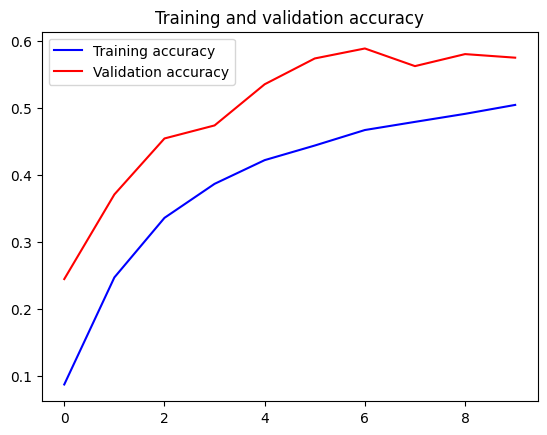

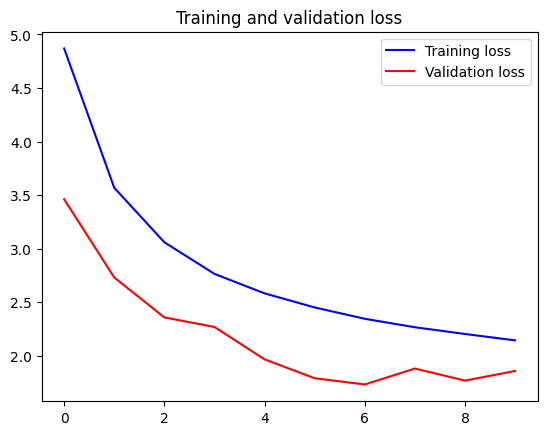

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')

plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')

plt.title('Training and validation loss')
plt.legend()
plt.show()

In [ ]:
predictions = model.predict(predict_ds)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

83/83 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step
This image most likely belongs to BANDED BROADBILL with a 79.19 percent confidence.


AttributeError: '_PrefetchDataset' object has no attribute 'Filepath'

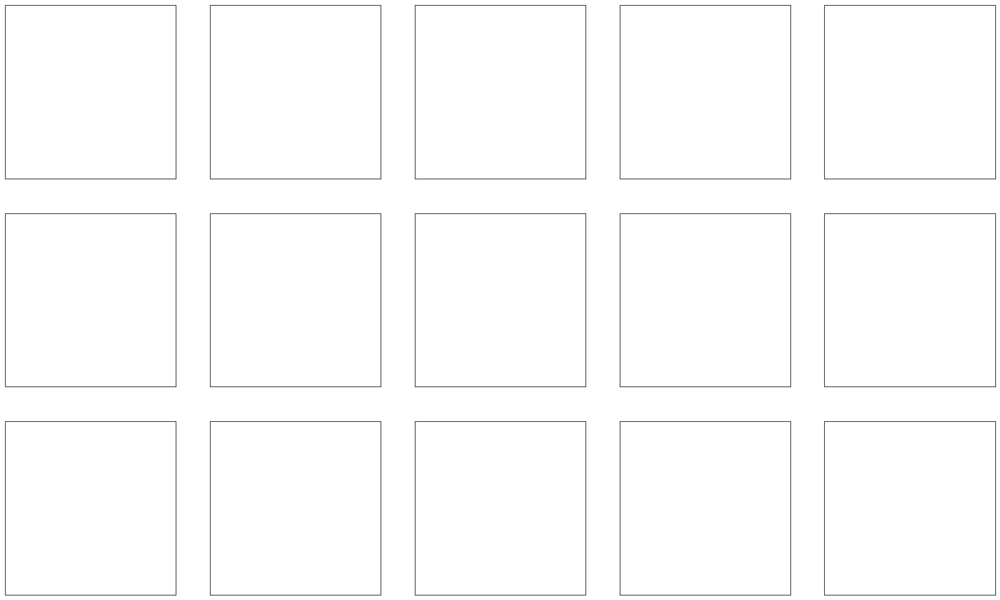

In [ ]:
random_index = np.random.randint(0, len(predict_ds) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(predict_ds.Filepath.iloc[random_index[i]]))
    if predict_ds.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {predict_ds.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

In [ ]:
pred = model.predict(predict_ds)
pred = np.argmax(pred,axis=1)
score = tf.nn.softmax(pred[0])
# plt.imshow()

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step


InvalidArgumentError: Value for attr 'T' of int64 is not in the list of allowed values: half, bfloat16, float, double
	; NodeDef: {{node Softmax}}; Op<name=Softmax; signature=logits:T -> softmax:T; attr=T:type,allowed=[DT_HALF, DT_BFLOAT16, DT_FLOAT, DT_DOUBLE]> [Op:Softmax] name: 

In [ ]:
pred = model.predict(predict_ds)
# pred = np.argmax(pred,axis=1)
score = tf.nn.softmax(pred[0])
# plt.imshow()

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step
This image most likely belongs to AZURE TANAGER with a 98.65 percent confidence.


No kernel connected

No kernel connected

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [ ]:
# dataset directory
data_dir = "D:\\Pygame projects\\DATH_TTNT\\Bird_recog"
# data_dir = pathlib.Path(data_dir).with_suffix('')
img_height = 224
img_width = 224
batch_size = 64

# image_count = len(list(data_dir.glob('*/*.jpg')))
# print(image_count)
# print(data_dir)
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\train",
    seed=42,
    color_mode='rgb',
    # label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\test",
    seed=42,
    color_mode='rgb',
    # label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)
predict_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir + "\\valid",
    seed=42,
    color_mode='rgb',
    # label_mode='categorical',
    image_size=(img_height, img_width),
    batch_size=batch_size)

class_names = train_ds.class_names

Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


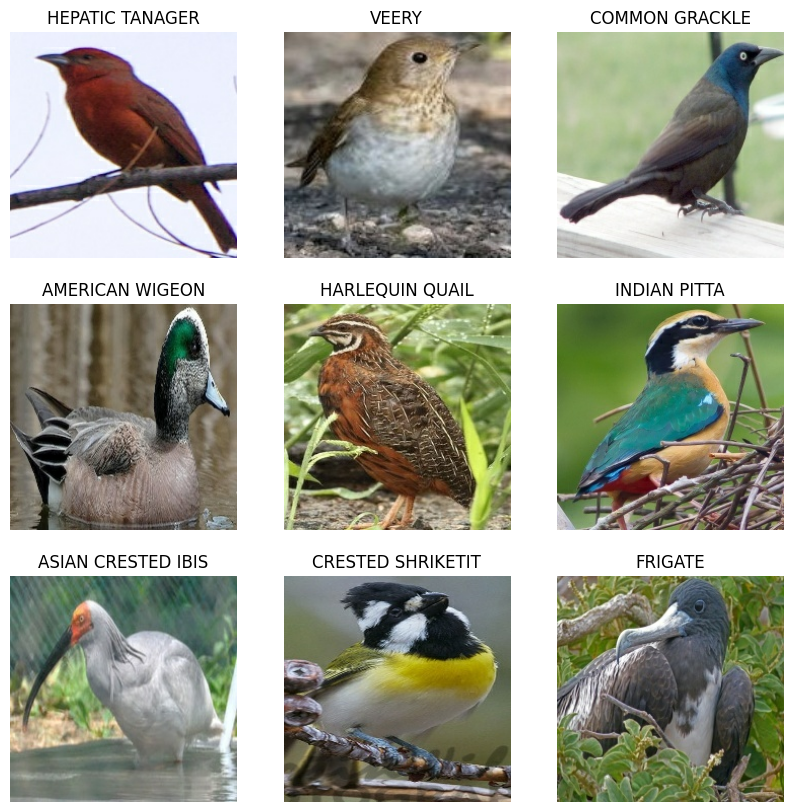

In [ ]:
# Visualize data
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [ ]:
# Create Keras model using Sequential
num_classes = len(class_names)
model = Sequential([
    # Data preprocessing
    layers.Resizing(112, 112, input_shape= (224, 224, 3) ),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    # Yoinking from tutorial, not optimized for accuracy
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.05),
    layers.Dense(num_classes)
    
])

# Model summary
# model.summary()

# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

d:\Pygame projects\DATH_TTNT\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train the model using train_ds
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 10
)

Epoch 1/10
1323/1323 ━━━━━━━━━━━━━━━━━━━━ 268s 201ms/step - accuracy: 0.0269 - loss: 5.6970 - val_accuracy: 0.2126 - val_loss: 3.7511
Epoch 2/10
1323/1323 ━━━━━━━━━━━━━━━━━━━━ 193s 146ms/step - accuracy: 0.1796 - loss: 3.9987 - val_accuracy: 0.3657 - val_loss: 2.7947
Epoch 3/10
1323/1323 ━━━━━━━━━━━━━━━━━━━━ 190s 143ms/step - accuracy: 0.2755 - loss: 3.3935 - val_accuracy: 0.4160 - val_loss: 2.5203
Epoch 4/10
1323/1323 ━━━━━━━━━━━━━━━━━━━━ 191s 145ms/step - accuracy: 0.3343 - loss: 3.0518 - val_accuracy: 0.4480 - val_loss: 2.4066
Epoch 5/10
1323/1323 ━━━━━━━━━━━━━━━━━━━━ 204s 154ms/step - accuracy: 0.3730 - loss: 2.8499 - val_accuracy: 0.4747 - val_loss: 2.2460
Epoch 6/10
1323/1323 ━━━━━━━━━━━━━━━━━━━━ 194s 146ms/step - accuracy: 0.3988 - loss: 2.6864 - val_accuracy: 0.5208 - val_loss: 2.1108
Epoch 7/10
1323/1323 ━━━━━━━━━━━━━━━━━━━━ 192s 145ms/step - accuracy: 0.4215 - loss: 2.5667 - val_accuracy: 0.5554 - val_loss: 1.8804
Epoch 8/10
1323/1323 ━━━━━━━━━━━━━━━━━━━━ 192s 145ms/step - ac

In [ ]:
result = model.evaluate(predict_ds, batch_size=batch_size)
print("test loss, test acc", result)

42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - accuracy: 0.4409 - loss: 2.6237
test loss, test acc [2.5830655097961426, 0.45257142186164856]
